In [3]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

import os
# Change working directory to the root of the project, try to be cautious with this implementation since it will break if the cell is run more than once
os.chdir(r"..")

import pandas as pd
from resources.constants import *

OUTFIT_EMBEDDINGS_DF_PATH = r"resources\data\outfit_embeddings_triplets_df.pkl"
REPRESENTATION_COLUMN = "outfit_embeddings"

pictures_df = pd.read_csv(PICTURE_TRIPLETS_CSV_PATH, sep=CSV_SEPARATOR)
user_triplets_df = pd.read_csv(USER_ACTIVITY_TRIPLETS_CSV_PATH, sep=CSV_SEPARATOR)

embeddings_df = pd.read_pickle(OUTFIT_EMBEDDINGS_DF_PATH)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Cluster 0: 6956
Cluster 1: 1504
Cluster 0:


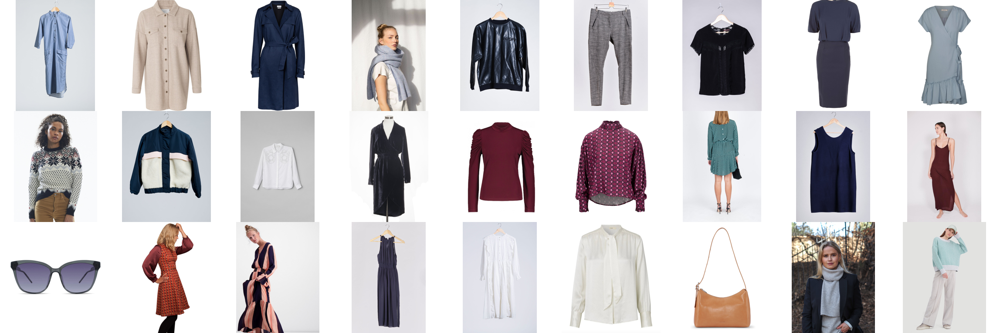

Cluster 1:


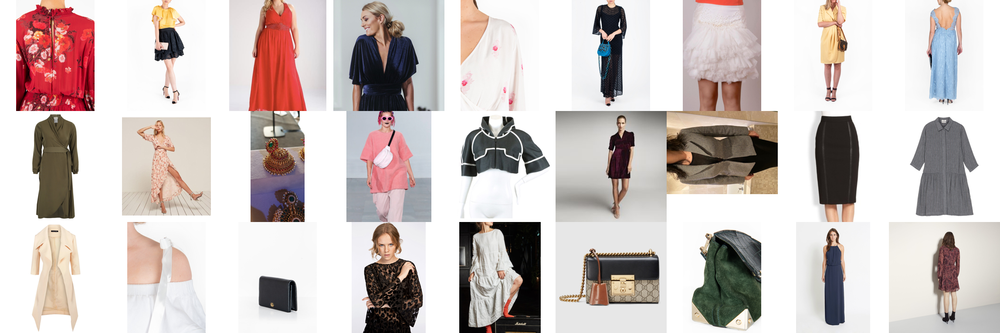

c:\Users\kaborg15\AppData\Local\anaconda3\envs\style_quiz_3.8\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


Cluster 0: 298
Cluster 1: 1206
Cluster 0:


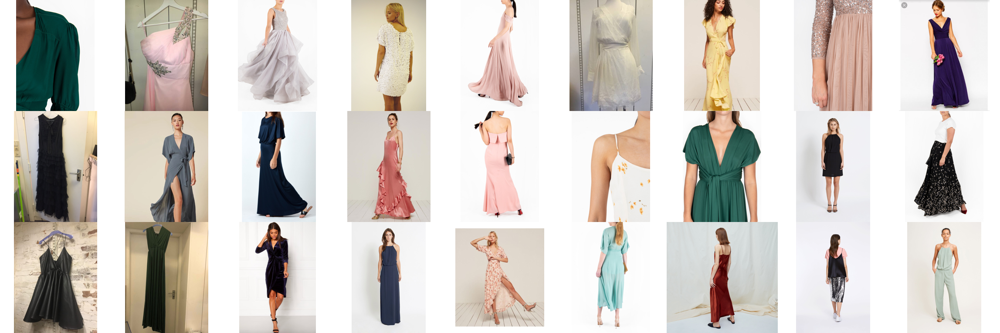

Cluster 1:


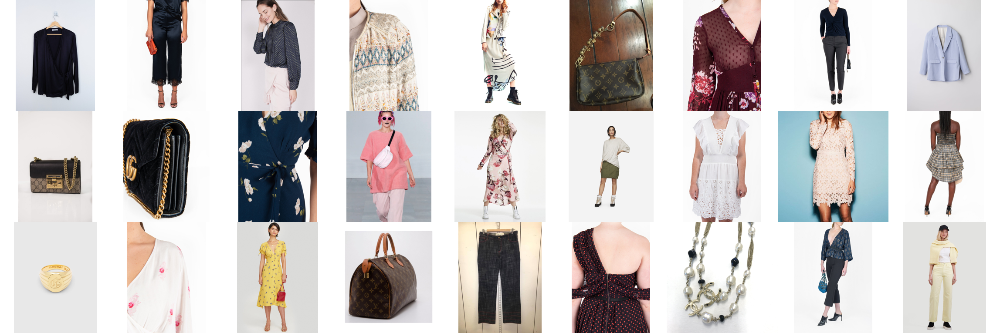

Final cluster: 


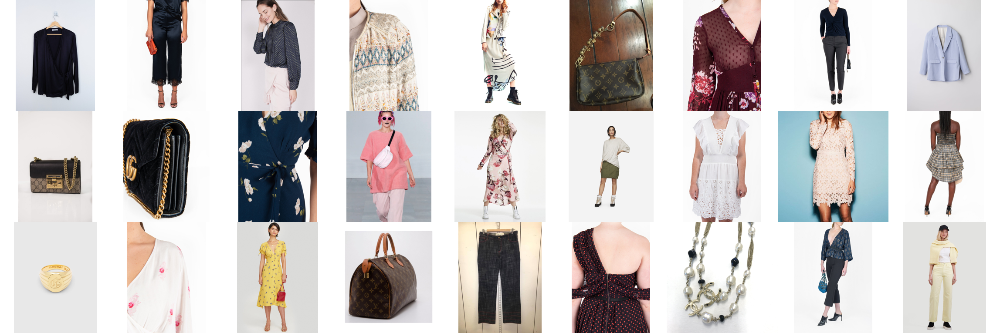

In [7]:
import time
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
import numpy as np
from src.display_images import display_image_ids

REPRESENTATION_COLUMN = "outfit_embeddings"
NUM_SAMPLES_PER_CLUSTER = 27

outfits_to_lead_picture_id_dict = embeddings_df.set_index("id")["lead_picture_id"].to_dict()
current_cluster_df = embeddings_df.dropna().copy()
chosen_cluster = ""

while chosen_cluster != "q":
    if len(current_cluster_df) <= NUM_SAMPLES_PER_CLUSTER:
        print("Converged to a single cluster.")
        break

    outfit_representations = np.stack(current_cluster_df[REPRESENTATION_COLUMN].values)
    kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(outfit_representations)
    current_cluster_df["cluster"] = kmeans.labels_

    cluster_samples = []
    for i in range(2):
        cluster_outfits = current_cluster_df[current_cluster_df["cluster"] == i].copy()
        cluster_embeddings = np.stack(cluster_outfits[REPRESENTATION_COLUMN].values)
        num_cluster_samples = min(NUM_SAMPLES_PER_CLUSTER, len(cluster_outfits))
        # cluster_kmeans = KMeans(n_clusters=num_cluster_samples, random_state=1, n_init="auto").fit(cluster_embeddings)
        # cluster_outfits["representation_cluster"] = cluster_kmeans.labels_
        # cluster_representation = cluster_outfits.groupby("representation_cluster").first().reset_index()

        cluster_kmedoids = KMedoids(n_clusters=num_cluster_samples, random_state=1, init="k-medoids++").fit(cluster_embeddings)
        cluster_representation = cluster_outfits.iloc[cluster_kmedoids.medoid_indices_].reset_index()
        cluster_samples.append(cluster_representation)

        print(f"Cluster {i}: {len(cluster_outfits)}")

    for i, cluster in enumerate(cluster_samples):
        print(f"Cluster {i}:")
        image_ids = [outfits_to_lead_picture_id_dict[outfit_id] for outfit_id in cluster["id"].values]
        cluster_collage = display_image_ids(image_ids)
        display(cluster_collage)

    time.sleep(1)
    chosen_cluster = ""
    while chosen_cluster not in ["0", "1", "q"]:
        chosen_cluster = input("Choose cluster: ")

    if chosen_cluster == "q":
        break
    
    chosen_cluster = int(chosen_cluster)
    current_cluster_df = current_cluster_df[current_cluster_df["cluster"] == chosen_cluster].copy()

print("Final cluster: ")
display(cluster_collage)